# Convergence Plot

### Authors : Daniel Luna (UFRN), Vicente Sousa (UFRN) e Ricardo Queiroz (UFRN)

In [1]:
import time
script_path = '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotScripts'
%cd $script_path

/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotScripts


/home/oai-ufrn/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
%%file ConvergencePlot.py
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Wed Oct  2 16:03:59 2019

@author: daniel
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import seaborn as sns
import scipy.stats as sci
import scipy.stats as st
import warnings
warnings.filterwarnings("ignore")
from itertools import cycle
import os
import argparse
import yaml 
from random import randint   
import itertools
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio

class openSimulation:
    def __init__(self, configurations_file, save_path, campaign_path):
        self.email_to = 'fulano@gmail.com'            
        with open(configurations_file, 'r') as f:
            self.doc = yaml.load(f, Loader=yaml.loader.BaseLoader)
            #self.doc = doc
        self.campaign_name = os.path.splitext(configurations_file)[0]
        
         # Simu parameters
        self.commandScript = ''
        for iscenarioParameters in self.doc['scenarioParameters'].items():
            commandraw= " --"+str(iscenarioParameters[0])+"="+str(iscenarioParameters[1][0])
            self.commandScript = self.commandScript + commandraw
        #teste = self.commandScript.split(' ')
        #print(teste[2].split('=')[1])

        #Plot parameters
        self.showPlot = True
        self.plotCI = False
        self.JobsConvergence = False
        self.window = 0.1 # window of 1ms

        # ns-3 script configuration
        self.script = str(self.doc['ScriptParameters']['script'])
        self.local_path = str(self.doc['ScriptParameters']['local_path'])
        self.save_path = save_path
        self.campaign_path = os.getcwd()
        #self.local_path = os.getcwd() + '/' + self.local_path
        self.cluster_path = str(self.doc['ScriptParameters']['cluster_path'])
        self.outputDirName = str(self.doc['ScriptParameters']['outputDir'][0])
        self.outputDir = str(self.doc['ScriptParameters']['outputDir'][1])
        self.seed = str(self.doc['ScriptParameters']['seed'])
        self.CampaignTag = str(self.doc['ScriptParameters']['CampaignTag'])
        self.configurations_file = configurations_file       
        self.simLocation = str(self.doc['ScriptParameters']['simLocation'])

        # Shell Script Parameters configuration
        self.nOfCurlines=self.doc['ShellScriptParameters']['nOfCurlines']
        self.SimTied = self.doc['ShellScriptParameters']['SimTied']
        self.nOfCurlinesTied = self.doc['ShellScriptParameters']['nOfCurlinesTied']
        self.daytime  = self.doc['ShellScriptParameters']['daytime']
        self.htime  = self.doc['ShellScriptParameters']['htime']
        self.ntasks = self.doc['ShellScriptParameters']['ntasks']
        self.cpusPerTask = self.doc['ShellScriptParameters']['cpusPerTask']
        self.numberOfJobsShellScript = int(self.doc['ShellScriptParameters']['numberOfJobsShellScript'])
        
         #Lines/curves
        self.campaignX = self.doc['campaignLines']['campaignX']
        print('campaignx:', self.campaignX)
        self.campaignLines = self.doc['campaignLines']['campaignLines']
        self.nJobs = int(self.doc['campaignLines']['jobs'])

    def VetorMediaAll (self, vetor,janela):
        NewVetorMedia = []
        VetorMedia=[]
        VetorVar=[]
        VetorMoment3=[]
        VetorMoment4=[]
        VetorVpp=[]
        VetorCorr=[]
        #media = np.mean(vetor[0:janela])
        #NewVetorMedia.append(np.ones(janela)*media)
        for i in range(0,len(vetor),janela):
            media = np.mean(vetor[i:i+janela])
            VetorMedia = np.append(VetorMedia,media)
            
            variancia = np.var(vetor[i:i+janela])
            VetorVar=np.append(VetorVar,variancia)
            
            momento3 = sci.moment(vetor[i:i+janela],moment=3)
            VetorMoment3=np.append(VetorMoment3,momento3)
            
            momento4 = sci.moment(vetor[i:i+janela],moment=4)
            VetorMoment4=np.append(VetorMoment4,momento4)
            
            vpp = np.max(vetor[i:i+janela]) - np.min(vetor[i:i+janela])
            VetorVpp=np.append(VetorVpp,vpp)
            
            corr = vetor[i:i+janela].dot(np.conj(vetor[i:i+janela]))
            VetorCorr=np.append(VetorCorr,corr)
            
            NewVetorMedia=np.concatenate((NewVetorMedia,np.ones(janela)*media),axis=0)
        return NewVetorMedia,VetorMedia,VetorVar,VetorMoment3,VetorMoment4,VetorVpp,VetorCorr
    
    def plotCampaign(self,curCampaign, metric,jobs):
        outputDir = self.save_path
        resultsDir = self.campaign_path
        njobs = min(jobs,self.nJobs)
        m_plr, m_plrCI, m_tput, m_tputCI, m_pkt, m_pktCI = [], [], [], [], [], []
        m_tput1,m_tput2=[],[]
        m_tputCI1,m_tputCI2,m_tputCI3,m_tputCI4=[],[],[],[]
        m_tputCI5,m_tputCI6,m_tputCI7,m_tputCI8=[],[],[],[]
        m_tputCI9,m_tputCI10=[],[]
        markers_on_all = cycle(list(itertools.product([0], [1,2,3,4,5])))
        markersA = cycle(('o','v', 'D', '>', 'h', '^', '*', '>', 's', 'H', 'D', 'd'))
        colors = cycle(('b', 'g', 'r', 'c', 'm', 'y', 'k'))
        linestyle = cycle(('-', '--'))# '-.', ':'))                    
        ls_plotly = cycle(("solid","dot","dash","longdash","dashdot","longdashdot")) 
        dfMeanTput = pd.DataFrame()
        dfMeanPlr = pd.DataFrame()
        dfMeanRxPkt = pd.DataFrame()    
        nOfCurlines=int(self.nOfCurlines[0]) # number of Campaign Lines in 1 simulation (max value = 3)
        SimTied = int(self.SimTied[0]) # whether or not the simulation parameters are tied (0 or 1)
        nOfCurlinesTied = int(self.nOfCurlinesTied[0]) # number of Campaign Lines tied (max value = nOfCurlines)
        print (nOfCurlines, SimTied,nOfCurlinesTied)
        if nOfCurlines == 1 and SimTied == 0:
            legend=[]
            legendSims=[]
            color=next(colors)
            marker=next(markersA)
            markers_on=next(markers_on_all)
            linestyle_on =next(linestyle)
            ls_plotly_on = next(ls_plotly)
            curline = self.campaignLines[0]
            campaignX = self.campaignX[0]
            dfMovingMeanAllSims=pd.DataFrame()
            dfMeanAllSims = pd.DataFrame()
            vtLastTimeValueAllSims = []
            isim = 0
            for i in range(len(self.doc['scenarioParameters'][curline])):
                for iCampaignX in range(len(self.doc['scenarioParameters'][campaignX])):
                    df=pd.DataFrame()
                    dfMovingMean=pd.DataFrame()
                    vtLastTimeValue=[]
                    if metric.split('-')[1] == 'MACRO':
                        if metric.split('-')[2] == 'SimTime':
                            for iJob in range(0,njobs):
                                if metric.split('-')[3] == 'NR':
                                    vtMean = []
                                    if self.UlMode: 
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/GnbRxPacketTrace.txt"
                                    else:
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/UeRxPacketTrace.txt"
                                    df = pd.read_csv(filepath,sep='\t',index_col=False)
                                    df2 = pd.DataFrame(df, columns=['Time','tbSize','SINR(dB)'])
                                    timeLastValue = df['Time'][len(df['Time'])-1]
                                elif metric.split('-')[3] == 'LTE':
                                    vtMean = []
                                    if self.UlMode: 
                                        print('To be implemented')
                                    elif not(self.UlMode) and metric.split('-')[0] == 'Tput':
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/DlRxPhyStats.txt"
                                        df = pd.read_csv(filepath,sep='\t',index_col=False)
                                    elif not(self.UlMode) and metric.split('-')[0] == 'SINR':    
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/DlRsrpSinrStats.txt"
                                        df = pd.read_csv(filepath,sep='\t',index_col=False)
                                        df['SINR(dB)']=10*np.log10(df['sinr'])
                                    
                                    df = df.rename({'% time': 'Time'},axis=1)
                                    df2 = pd.DataFrame(df, columns=['Time','tbSize','SINR(dB)'])
                                    
                                    timeLastValue = df['Time'][len(df['Time'])-1]
                                
                                if metric.split('-')[0] == 'Tput': ## Calculate the PHY Throughput    
                                    df2.dropna(inplace=True)    
                                    ylabelpart2 = ' (kbps)'
                                    ndf2ShapePos0 = df2.shape[0]
                                    self.window=0.1
                                    WindowSize=len(df2[df2['Time']<=  df2.Time[0] + self.window])
                                    WindowSizeH = WindowSize
                                    WindowSizeL =0
                                    while ndf2ShapePos0 != WindowSizeH:
                                        if WindowSize == 0:
                                            medias = 0
                                        else:
                                            [vetor,medias,variancia,moment3,moment4,vpp,correlacao] = self.VetorMediaAll(df2.tbSize[WindowSizeL:WindowSizeH].values,WindowSize)
                                        vtMean = np.append(vtMean, medias);
                                        self.window+=0.1
                                        WindowSizeL = WindowSize
                                        WindowSizeH=len(df2[df2['Time']<=  df2.Time[0] + self.window])
                                        WindowSize = WindowSizeH - WindowSizeL
                                    
                                    vtMeandf = pd.DataFrame(vtMean)
                                    dfMovingMean = pd.concat([dfMovingMean,vtMeandf], axis=1)
                                    vtLastTimeValue = np.append(vtLastTimeValue,timeLastValue)
                                elif metric.split('-')[0] == 'SINR': ## Calculate the PHY SINR
                                    df2.dropna(inplace=True)    
                                    ylabelpart2 = ' (dB)'
                                    ndf2ShapePos0 = df2.shape[0]
                                    self.window=0.1
                                    WindowSize=len(df2[df2['Time']<=  df2.Time[0] + self.window])
                                    WindowSizeH = WindowSize
                                    WindowSizeL =0
                                    while ndf2ShapePos0 != WindowSizeH:
                                        if WindowSize == 0:
                                            medias = 0
                                        else:
                                            [vetor,medias,variancia,moment3,moment4,vpp,correlacao] = self.VetorMediaAll(10**(df2['SINR(dB)'][WindowSizeL:WindowSizeH].values/10),WindowSize)
                                        vtMean = np.append(vtMean, 10*np.log10(medias))
                                        self.window+=0.1
                                        WindowSizeL = WindowSize
                                        WindowSizeH=len(df2[df2['Time']<=  df2.Time[0] + self.window])
                                        WindowSize = WindowSizeH - WindowSizeL
                                    
                                    vtMeandf = pd.DataFrame(vtMean)
                                    dfMovingMean = pd.concat([dfMovingMean,vtMeandf], axis=1)
                                    vtLastTimeValue = np.append(vtLastTimeValue,timeLastValue)

                                    
                            vtLastTimeValueAllSims = np.append(vtLastTimeValueAllSims,vtLastTimeValue.mean())
                            if metric.split('-')[0] == 'Tput':
                                dfMovingMeanAllSims = pd.concat([dfMovingMeanAllSims,dfMovingMean.dropna().mean(axis=1)/0.1], axis=1) # dividing by the window to calcutate tput
                            elif metric.split('-')[0] == 'SINR':
                                dfMovingMeanAllSims = pd.concat([dfMovingMeanAllSims,dfMovingMean.dropna().mean(axis=1)], axis=1)
                        elif metric.split('-')[2] == 'Jobs':
                            vtMeanJobs = []
                            for iJob in range(0,njobs):
                                if metric.split('-')[3] == 'NR':
                                    vtMean = []
                                    if self.UlMode: 
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/GnbRxPacketTrace.txt"
                                    else:
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/UeRxPacketTrace.txt"
                                    df = pd.read_csv(filepath,sep='\t',index_col=False)
                                    df2 = pd.DataFrame(df, columns=['Time','tbSize','SINR(dB)'])
                                    timeLastValue = df['Time'][len(df['Time'])-1]
                                elif metric.split('-')[3] == 'LTE':
                                    vtMean = []
                                    if self.UlMode: 
                                        print('To be implemented')
                                    elif not(self.UlMode) and metric.split('-')[0] == 'Tput':
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/DlRxPhyStats.txt"
                                        df = pd.read_csv(filepath,sep='\t',index_col=False)
                                    elif not(self.UlMode) and metric.split('-')[0] == 'SINR':    
                                        filepath = outputDir +"/JOB"+str(iJob)+"/Sim_"+str(isim)+"/DlRsrpSinrStats.txt"
                                        df = pd.read_csv(filepath,sep='\t',index_col=False)
                                        df['SINR(dB)']=10*np.log10(df['sinr'])
                                    
                                    df = df.rename({'% time': 'Time'},axis=1)
                                    df2 = pd.DataFrame(df, columns=['Time','tbSize','SINR(dB)'])
                                if metric.split('-')[0] == 'Tput':
                                    ylabelpart2 = '(kbps)'
                                    vtMeanJobs = np.append(vtMeanJobs, df2['tbSize'].sum()/df2.iloc[-1,0]/1000) #kbps
                                elif metric.split('-')[0] == 'SINR':
                                    ylabelpart2 = '(dB)'
                                    vtMeanJobs = np.append(vtMeanJobs,10*np.log10(np.mean(10**(df2['SINR(dB)']/10)))) #dB
                            dfMeanJobs = pd.DataFrame(vtMeanJobs)
                            dfMeanAllSims = pd.concat([dfMeanAllSims,dfMeanJobs], axis=1)  
                    isim +=1
            #Legend of 2/0/0
            for ilegend in self.doc['scenarioParameters'][curline]:
                legendEntry = self.CampaignTag + ": " + curline + " " + ilegend
                legend.append(legendEntry) 
                for ilegendcdf in self.doc['scenarioParameters'][campaignX]:
                    legendSimsEntry = legendEntry + "," + " " + campaignX + " " + ilegendcdf 
                    legendSims.append(legendSimsEntry)
        
        
        #//////////////////////////////////////////////////////////////////////////////////////////
        #//////////////////////////////////////////////////////////////////////////////////////////
        
        elif nOfCurlines==3 and SimTied == 1 and nOfCurlinesTied == 3:
            legend = []
            legendSims = []
            color = next(colors)
            marker = next(markersA)
            markers_on = next(markers_on_all)
            linestyle_on = next(linestyle)
            ls_plotly_on = next(ls_plotly)
            curline = self.campaignLines[0]
            curline1 = self.campaignLines[1]
            curline2 = self.campaignLines[2]
            campaignX = self.campaignX[0]
            simNum = self.ntasks[0]
            dfMeanAllSims = pd.DataFrame()
            dfMeanJobsAccumulated = pd.DataFrame()
            dfIntervalAllSims = pd.DataFrame()
            for isimNum in range(int(self.doc['ShellScriptParameters']['ntasks'])):
                df=pd.DataFrame()
                if metric.split('-')[1] == 'Jobs':
                    vtJobs = []
                    vtMeanJobs = []
                    vtMeanJobsAccumulated = []
                    vtInterval = []
                    vtIntervalJobs = []
                    for iJob in range(0,njobs):
                        #print('iJob:', iJob)
                        #print('isim: ',isimNum)
                        if metric.split('-')[2] == 'Capacity':
                            filepath = resultsDir +"/JOB"+str(iJob)+"/Sim_"+str(isimNum)+"/df_capacities.csv"
                            #print(filepath)
                            df = pd.read_csv(filepath, usecols=['odc_locations', 'capacities'])                            
                            vtJobs = np.append(vtJobs,df['capacities'])
                            vtMeanJobs = np.mean(vtJobs)
                            vtMeanJobsAccumulated = np.append(vtMeanJobsAccumulated,vtMeanJobs)
                            #print(vtMeanJobsAccumulated)
                            _, vtInterval = st.t.interval(0.99, len(vtJobs)-1, loc=vtMeanJobs, scale=st.sem(vtJobs))
                            #print('vtinterval', vtInterval)
                            vtIntervalJobs.append(vtInterval - vtMeanJobs)
                            #print(vtIntervalJobs)
                            ylabelpart2 = '(CPUs/ODC)'
                        elif metric.split('-')[2] == 'Fiberlenght':
                            filepath = resultsDir +"/JOB"+str(iJob)+"/Sim_"+str(isimNum)+"/df_fiberlength.csv"
                            df = pd.read_csv(filepath, usecols=['odc_locations', 'fiberlength'])
                            vtJobs = np.append(vtJobs,df['fiberlength'])
                            vtMeanJobs = np.mean(vtJobs)
                            vtMeanJobsAccumulated = np.append(vtMeanJobsAccumulated,vtMeanJobs)
                            #print(vtMeanJobsAccumulated)
                            _, vtInterval = st.t.interval(0.99, len(vtJobs)-1, loc=vtMeanJobs, scale=st.sem(vtJobs))
                            vtIntervalJobs.append(vtInterval - vtMeanJobs)
                            #print(vtIntervalJobs)
                            ylabelpart2 = '(kms)'
                    dfMeanJobsAccumulated = pd.DataFrame(vtMeanJobsAccumulated)
                    dfMeanAllSims = pd.concat([dfMeanAllSims,dfMeanJobsAccumulated], axis=1)
                    dfIntervalJobs = pd.DataFrame(vtIntervalJobs)
                    dfIntervalAllSims = pd.concat([dfIntervalAllSims,dfIntervalJobs], axis=1)
                    #print(dfIntervalAllSims)
            #Legend of 3/1/3
            curlineLegend = self.doc['scenarioParameters'][curline]
            curlineLegend1 = self.doc['scenarioParameters'][curline1]
            curlineLegend2 = self.doc['scenarioParameters'][curline2]
            for ilegend in range(len(self.doc['scenarioParameters'][curline])):
                legendtag = self.CampaignTag + ": " + curline + " " + curlineLegend[ilegend] + ", " + curline1 + " " + curlineLegend1[ilegend] + ", " + curline2 + " " + curlineLegend2[ilegend]
                #print('ilegend', ilegend)
                #print('curline', curline[ilegend])
                for ilegendcdf in self.doc['scenarioParameters'][campaignX]:
                    legendSimsEntry = legendtag + "," + " " + campaignX + " " + ilegendcdf 
                    legendSims.append(legendSimsEntry)
                    #print('legendSimsEntry', legendSimsEntry)

        ##### START OF PLOTTING SECTION ####         

        
        #labelA = cycle(legend)
        labelAsims = cycle(legendSims) 
        #label = next(labelA)
        labelSims = next(labelAsims)
        datatputPHY=[]
        if metric.split('-')[1] == 'Jobs':
            xlabel='Jobs'
            ylabel=metric +" "+ ylabelpart2
            plt.figure(figsize=(20,10))
            for i in range (dfMeanAllSims.shape[1]):
                resxData = np.linspace(1,njobs,len(dfMeanAllSims.iloc[:,i]))
                resyData = dfMeanAllSims.iloc[:,i].to_numpy()
                #plt.plot(resxData, resyData, label=labelSims, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                plt.errorbar(resxData,resyData, yerr = dfIntervalAllSims.iloc[:,i], marker=marker,color=color, ls = 'none', lw = 2, capthick = 2,markevery=markers_on)
                trace1 = go.Scatter(
                    x=resxData,
                    y=resyData,
                    error_y=dict(type='data', # value of error bar given in data coordinates
                                array=dfIntervalAllSims.iloc[:,i],
                                visible=True),
                    name=labelSims,
                    line_dash=ls_plotly_on,
                    marker_symbol=markers_on
                )
                datatputPHY.append(trace1)
                color=next(colors)
                marker=next(markersA)
                markers_on=next(markers_on_all)
                labelSims = next(labelAsims)
                linestyle_on=next(linestyle)
                ls_plotly_on = next(ls_plotly)
            layout = go.Layout(
                yaxis=dict(
                    domain=[0, 1]
                ),
                legend=dict(
                    traceorder="normal"
                ),
                xaxis_title=xlabel,
                yaxis_title=ylabel
                )
            
            fig = go.Figure(data=datatputPHY, layout=layout)
            plt.xlabel(xlabel)
            plt.ylabel(ylabel)
            #plt.xlim([0.10, 0.55]) 
            #plt.legend(loc='best', numpoints=1)
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid()
            #plt.tight_layout()
            #plt.show()

        #os.makedirs(outputDir+"/ps", exist_ok=True)
        os.makedirs(outputDir+"/Convergence/"+campaign_path.split('/')[-2]+"/png", exist_ok=True)
        os.makedirs(outputDir+"/Convergence/"+campaign_path.split('/')[-2]+"/html", exist_ok=True)
    
        
        if bool(self.plotCI):
            imgfilename = metric + '_CI_'+curCampaign
        else:
            imgfilename = metric + '_CI_'+curCampaign
        plt.savefig(outputDir+"/Convergence/"+campaign_path.split('/')[-2]+"/png/"+imgfilename+'.png')
        #plt.savefig(outputDir+"/ps/"+imgfilename+".eps")
        pio.write_html(fig, file=outputDir+"/Convergence/"+campaign_path.split('/')[-2]+"/html/"+imgfilename+'.html', auto_open=True)
        if bool(self.showPlot):
            plt.show()
            fig.show()
        else:
            plt.close()
        
parser = argparse.ArgumentParser()
parser.add_argument("-j", "--jobs", type=str, help='The script will ignore the value in .yaml')
parser.add_argument("-f", "--file", type=str, help='Configuration File')
parser.add_argument("-p", "--campaign_path", type=str, help='Path')
parser.add_argument("-s", "--save_path", type=str, help='Path to save the output files')
args = parser.parse_args()
configurations_file = args.file
campaign_path = args.campaign_path
jobs = int(args.jobs)
save_path = args.save_path
os.chdir(campaign_path)

with open(configurations_file, 'r') as f:
    doc = yaml.load(f, Loader=yaml.loader.BaseLoader)
    campaign_name = os.path.splitext(configurations_file)[0]
    print('Simulação escolhida: ')

campaign = doc['campaignLines']['campaignX']
print(campaign)
simu = openSimulation(configurations_file, save_path, campaign_path)

finalMetrics = ['MACRO-Jobs-Capacity',
                'MACRO-Jobs-Fiberlenght']

for iMet in finalMetrics:
    for simC in campaign:
        simu.plotCampaign(simC,iMet,jobs)


Overwriting ConvergencePlot.py


# Convergence Metrics

### São Paulo

/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotScripts


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Simulação escolhida: 
['odcs']
campaignx: ['odcs']
3 1 3


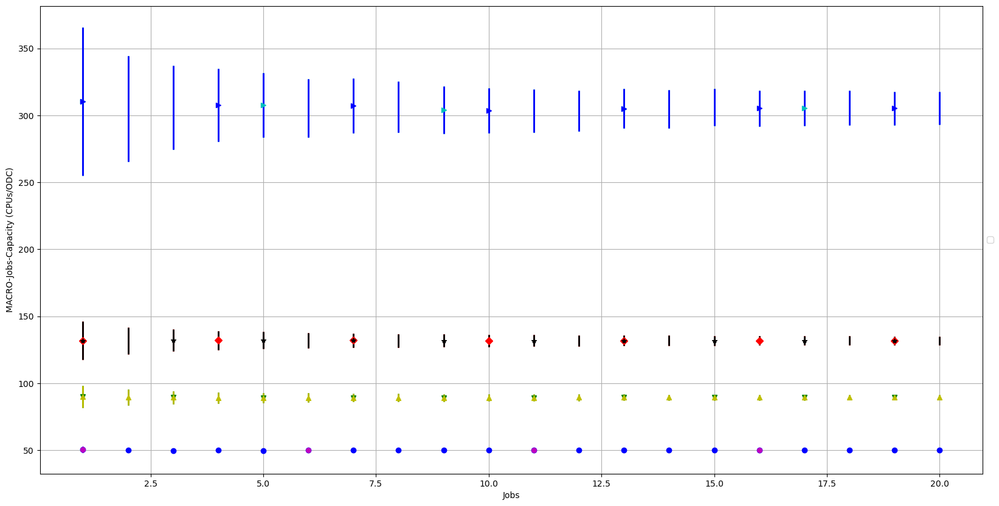

3 1 3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


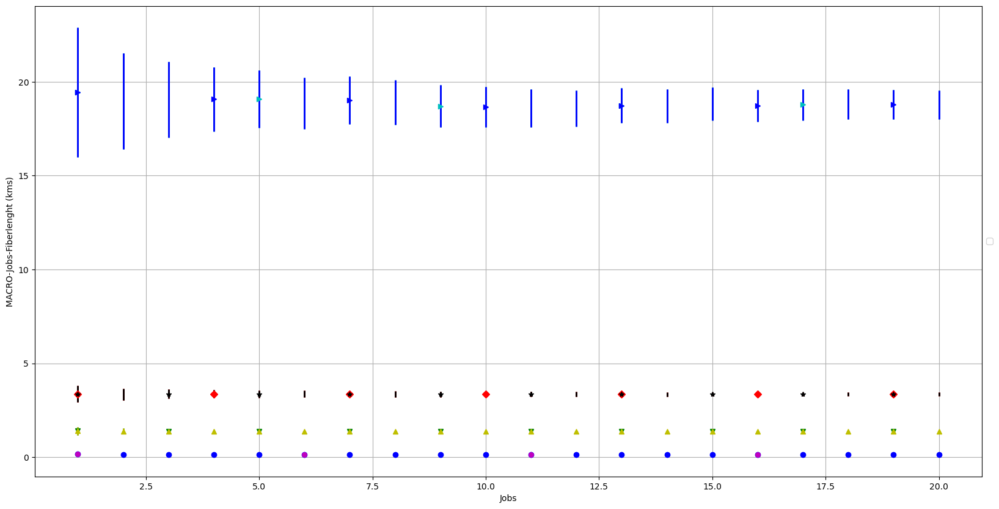

In [3]:
#Windows:
#%cd $opath\ScriptsPlot
#%run ConvergencePlot -f "NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84.yaml" -p $opath\results_cluster_NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84_Lambda

#Linux:
%cd $script_path
time.sleep(1)
%run ConvergencePlot -j "20" -f "Placement_SaoPaulo_Case_1_2_cluster.yaml" -p '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/Results/results_Placement_SaoPaulo_Case_1_2_cluster_odcs/' -s '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotResults/'

### Recife

/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotScripts


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Simulação escolhida: 
['odcs']
campaignx: ['odcs']
3 1 3


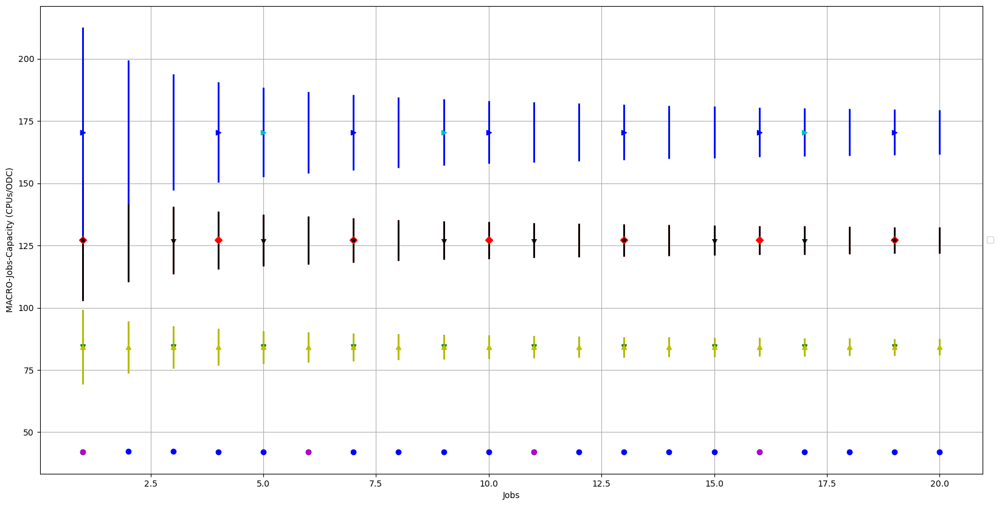

3 1 3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


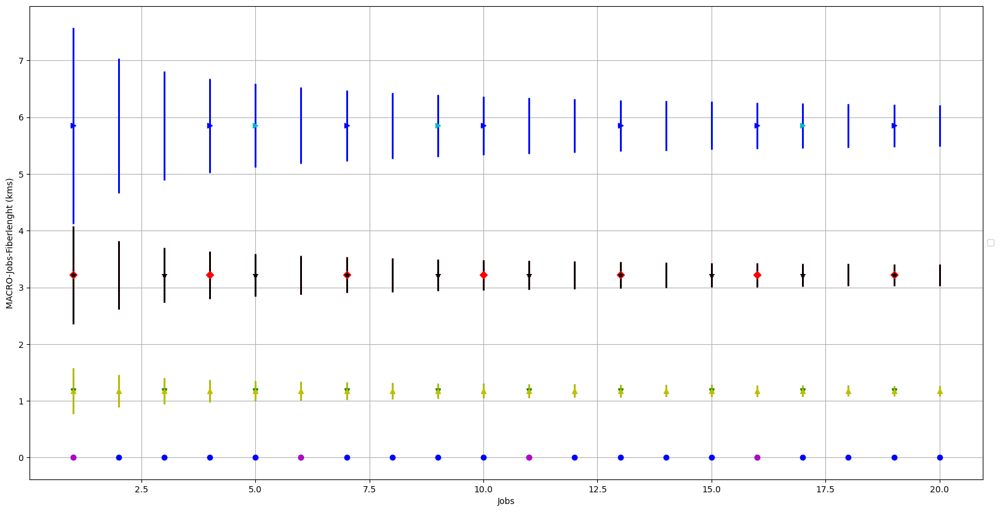

In [4]:
#Windows:
#%cd $opath\ScriptsPlot
#%run ConvergencePlot -f "NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84.yaml" -p $opath\results_cluster_NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84_Lambda

#Linux:
%cd $script_path
time.sleep(1)
%run ConvergencePlot -j "20" -f "Placement_Recife_Case_1_2_cluster.yaml" -p '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/Results/results_Placement_Recife_Case_1_2_cluster_odcs/' -s '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotResults/'

### Manaus

/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotScripts


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Simulação escolhida: 
['odcs']
campaignx: ['odcs']
3 1 3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


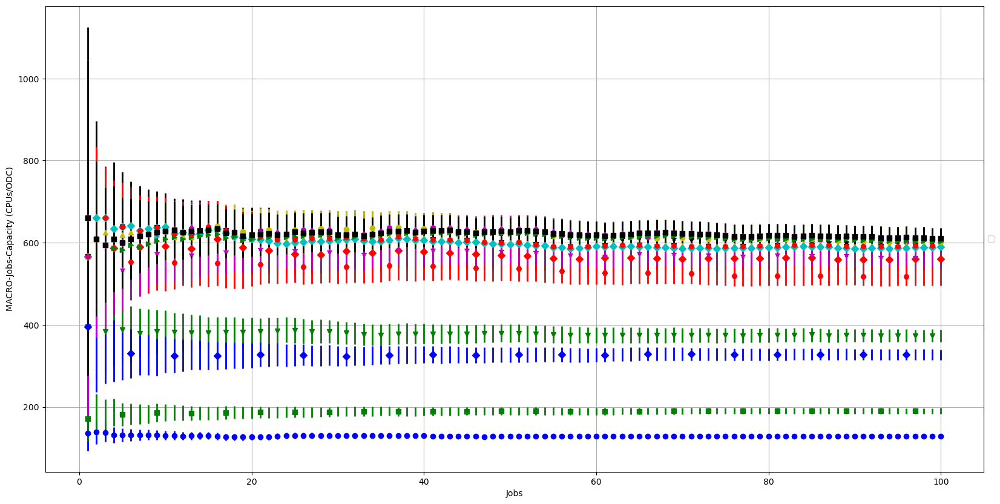

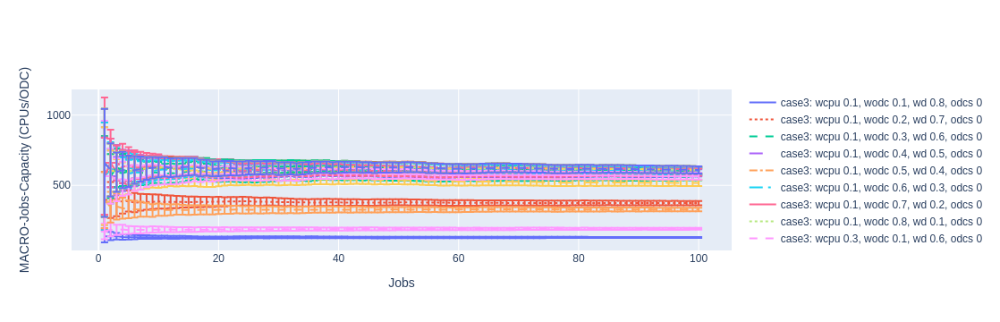

3 1 3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


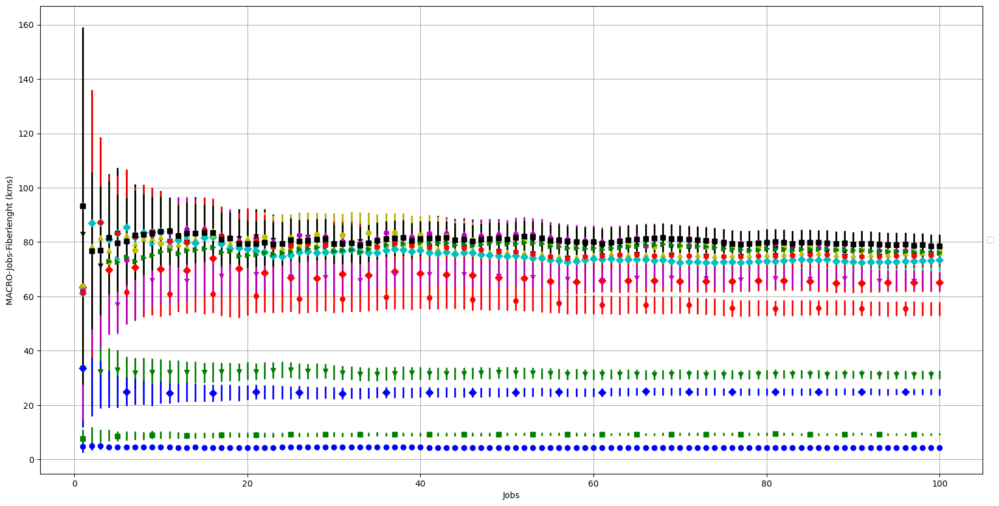

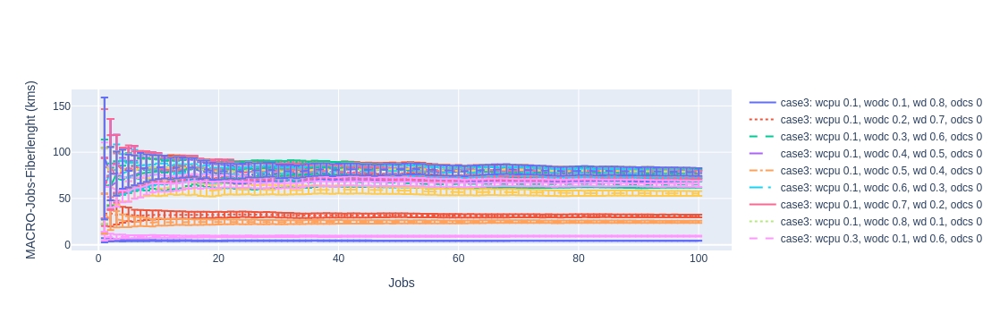

In [3]:
#Windows:
#%cd $opath\ScriptsPlot
#%run ConvergencePlot -f "NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84.yaml" -p $opath\results_cluster_NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84_Lambda

#Linux:
%cd $script_path
time.sleep(1)
%run ConvergencePlot -j "100" -f "Placement_Manaus_Case_4.yaml" -p '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/Results/results_Placement_Manaus_Case_4_odcs/' -s '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotResults/'

### Natal

/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotScripts
Simulação escolhida: 
['odcs']
campaignx: ['odcs']
3 1 3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


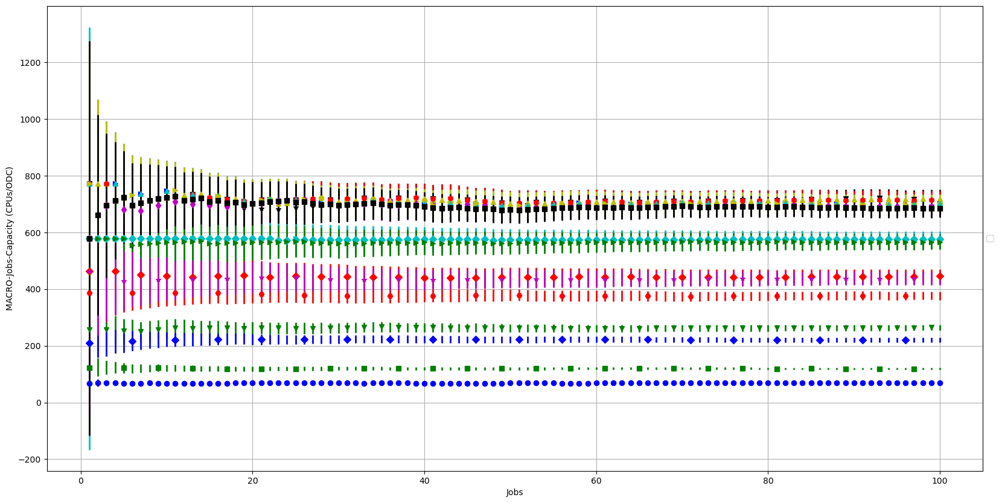

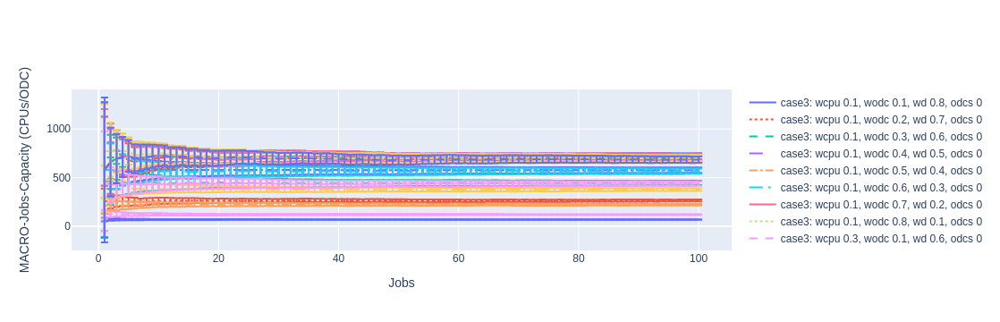

3 1 3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


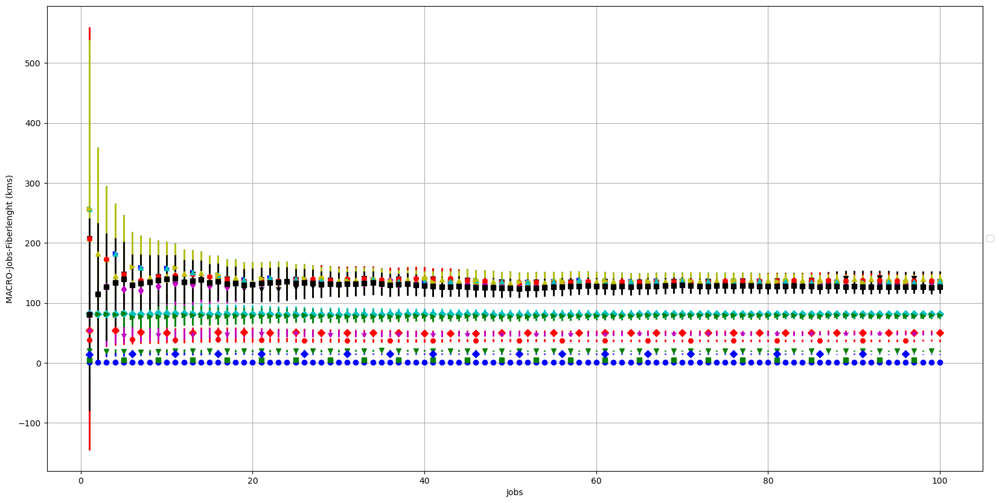

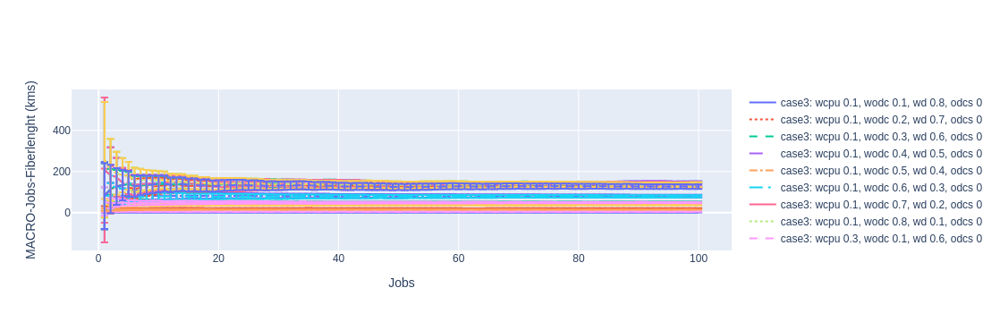

In [4]:
#Windows:
#%cd $opath\ScriptsPlot
#%run ConvergencePlot -f "NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84.yaml" -p $opath\results_cluster_NrMmtc_SimPerScriptCampaign_UlTdd_Prbs96_ueNumScenario84_Lambda

#Linux:
%cd $script_path
time.sleep(1)
%run ConvergencePlot -j "100" -f "Placement_Natal_Case_4.yaml" -p '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/Results/results_Placement_Natal_Case_4_odcs/' -s '/home/oai-ufrn/Repositories/open_ran_datacenter_placement/PlotResults/'